In [1]:
import json
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import mpld3
import re
import itertools
import math

In [2]:
ResourcePath = "Resource/"

In [3]:
bf_filename = ['beforeInteraction', 'beforeInteraction_d1', 'beforeInteraction_d2']

In [4]:
bf_data = dict()
for idx, i in enumerate(bf_filename):
    bf_data[idx]= json.load(open('{}{}.json'.format(ResourcePath, i),'rb'))

In [5]:
# Get People or Tweet
bf_nodes = dict()
for i in range(3):
    for twt in bf_data[i]:
        source = twt['username']
        tweet = twt['tweet_id']
        like_user = twt['likes']
        retweet_user = twt['retweet']
        
        bf_nodes[source] = 'people'
        bf_nodes[tweet] = 'tweet'
        
        for j in like_user:
            bf_nodes[j] = 'people'

        for j in retweet_user:
            bf_nodes[j] = 'people'

In [6]:
def mergeDict(dict1, dict2):
   dict3 = {**dict1, **dict2}
   for key, value in dict3.items():
       if key in dict1 and key in dict2:
               dict3[key] = [value , dict1[key]]
   return dict3

In [7]:
def add_edges(edgeDict, source, to):
    edgeDict[(source, to)] = edgeDict.get((source, to), 0) + 1

def get_edges(data):
    edgeDict = dict()
    for i in range(len(data)):
        username = data[i]['username']
        tweet_id = data[i]['tweet_id']
        add_edges(edgeDict, username, tweet_id)
        add_edges(edgeDict, tweet_id, username)
        for j in data[i]['likes']:
            add_edges(edgeDict, j, tweet_id)
        for j in data[i]['retweet']:
            add_edges(edgeDict, j, tweet_id)
    return edgeDict

bf_edges = dict()
for i in range(3):
    bf_edges = mergeDict(bf_edges, get_edges(bf_data[i]))

In [8]:
def forceatlas2_layout(G, iterations=30, linlog=False, pos=None, nohubs=False,
                       kr=0.001, k=None, dim=2):
    """
    Options values are
    g                The graph to layout
    iterations       Number of iterations to do
    linlog           Whether to use linear or log repulsion
    random_init      Start with a random position
                     If false, start with FR
    avoidoverlap     Whether to avoid overlap of points
    degreebased      Degree based repulsion
    """
    # We add attributes to store the current and previous convergence speed
    for n in G:
        G.nodes[n]['prevcs'] = 0
        G.nodes[n]['currcs'] = 0
        # To numpy matrix
    # This comes from the spares FR layout in nx
    A = nx.to_scipy_sparse_matrix(G, dtype='f')
    nnodes, _ = A.shape

    try:
        A = A.tolil()
    except Exception as e:
        A = (coo_matrix(A)).tolil()
    if pos is None:
        pos = np.asarray(np.random.random((nnodes, dim)), dtype=A.dtype)
    else:
        pos = pos.astype(A.dtype)
    if k is None:
        k = np.sqrt(1.0 / nnodes)
        # Iterations
    # the initial "temperature" is about .1 of domain area (=1x1)
    # this is the largest step allowed in the dynamics.
    t = 0.1
    # simple cooling scheme.
    # linearly step down by dt on each iteration so last iteration is size dt.
    dt = t / float(iterations + 1)
    displacement = np.zeros((dim, nnodes))
    for iteration in range(iterations):
        displacement *= 0
        # loop over rows
        for i in range(A.shape[0]):
            # difference between this row's node position and all others
            delta = (pos[i] - pos).T
            # distance between points
            distance = np.sqrt((delta ** 2).sum(axis=0))
            # enforce minimum distance of 0.01
            distance = np.where(distance < 0.01, 0.01, distance)
            # the adjacency matrix row
            Ai = np.asarray(A.getrowview(i).toarray())
            # displacement "force"
            Dist = k * k / distance ** 2
            if nohubs:
                Dist = Dist / float(Ai.sum(axis=1) + 1)
            if linlog:
                Dist = np.log(Dist + 1)
            displacement[:, i] += \
                (delta * (Dist - Ai * distance / k)).sum(axis=1)
            # update positions
        length = np.sqrt((displacement ** 2).sum(axis=0))
        length = np.where(length < 0.01, 0.01, length)
        pos += (displacement * t / length).T
        # cool temperature
        t -= dt
        # Return the layout
    return dict(zip(G, pos))


In [24]:
G1 = nx.DiGraph()

for key, value in bf_nodes.items():
    G1.add_node(key)

for key, value in bf_edges.items():
    G1.add_edge(key[0], key[1], weight = 1 / value)


In [25]:
def trim_edges(G, threshold = 1):
    g = nx.DiGraph()
    for f, to, edata in G.edges(data=True):
        if edata['weight'] <= 1 / threshold:
            g.add_edge(f, to, weight = edata['weight'])
    return g

g = trim_edges(G1, 2)
g.remove_nodes_from(list(nx.isolates(g)))

subgraph_len = [len(c) for c in nx.weakly_connected_components(g)]
print(sorted(subgraph_len, reverse=True))

def island(g, minimumnode):
    for component in list(nx.weakly_connected_components(g)):
        if len(component) < minimumnode:
            for node in component:
                g.remove_node(node)
    return g

g = island(g, 10)
subgraph_len = [len(c) for c in nx.weakly_connected_components(g)]
print(sorted(subgraph_len, reverse=True))

# print(g.edges)

[511, 48, 16, 12, 11, 8, 6, 6, 5, 5, 4, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]
[511, 48, 16, 12, 11]


672 598


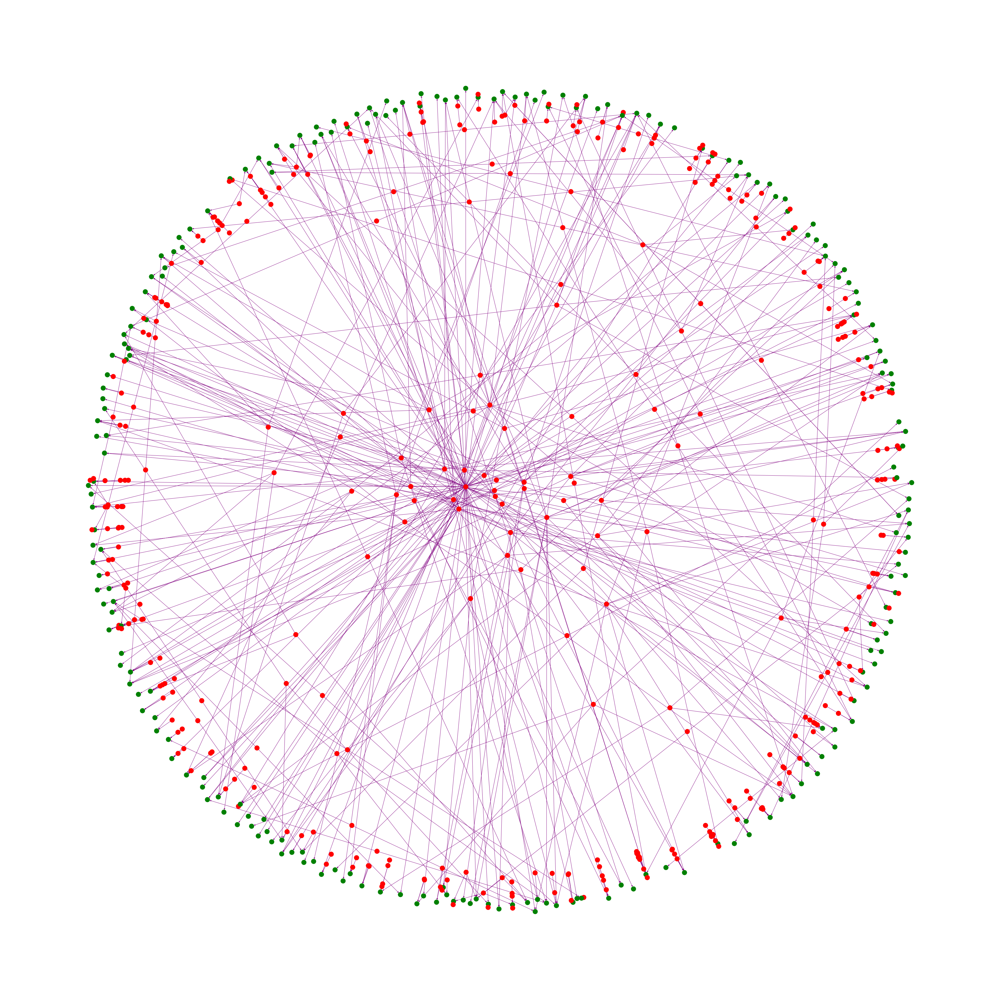

In [32]:
plt.figure(figsize=(50,50))
g = nx.
pos = forceatlas2_layout(g, iterations=200)
# pos = nx.spring_layout(g)
# pos = nx.random_layout(g)

nodeColor = []
for i in g.nodes:
    if bf_nodes[i] == 'people':
        nodeColor.append('r')
    else:
        nodeColor.append('g')

nx.draw(g, with_labels=False, node_color=nodeColor, edge_color='purple', node_shape = 'o' , pos=pos)
# nx.draw_networkx_labels(g, pos ,labels=af_labels)

print(len(g.edges), len(g.nodes))
plt.show()

672 598


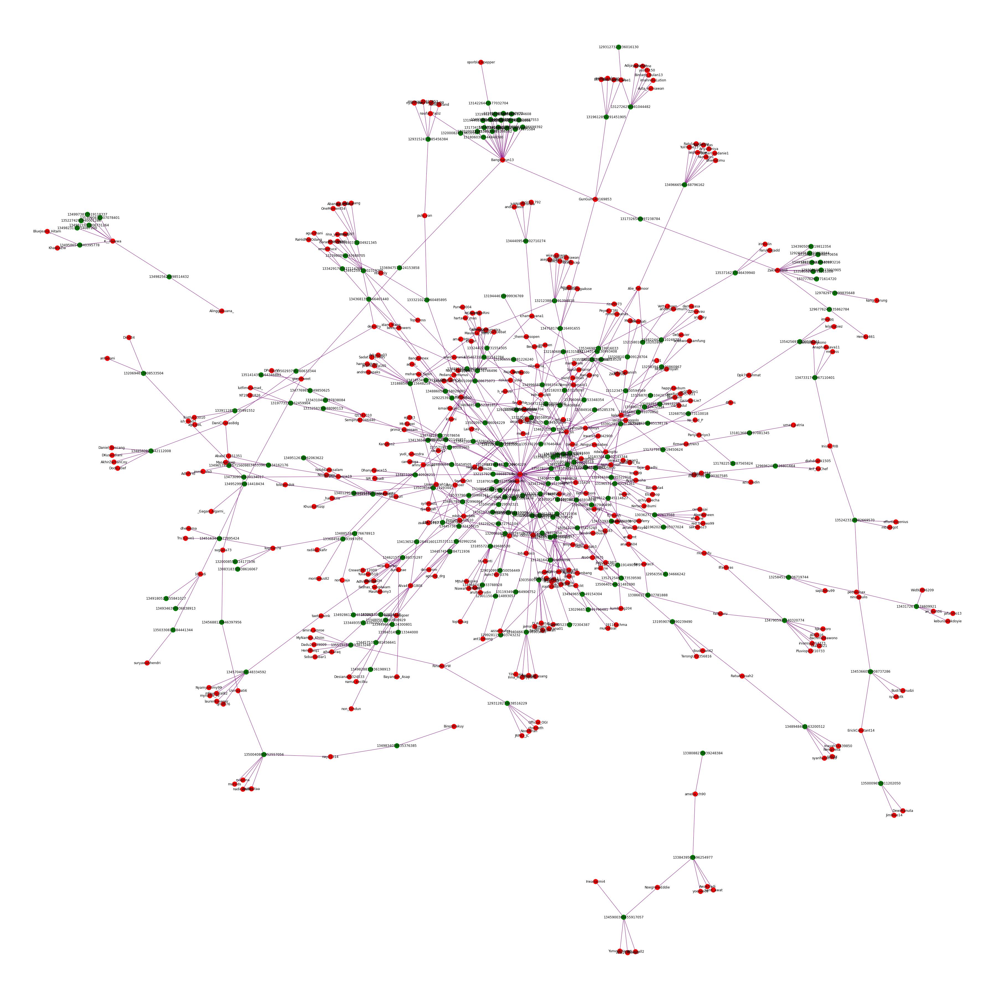

In [36]:
plt.figure(figsize=(50,50))
# g = nx.to_undirected(g)
# pos = forceatlas2_layout(g, iterations=200)
pos = nx.spring_layout(g)
# pos = nx.random_layout(g)

nodeColor = []
for i in g.nodes:
    if bf_nodes[i] == 'people':
        nodeColor.append('r')
    else:
        nodeColor.append('g')

nx.draw(g, with_labels=True, node_color=nodeColor, edge_color='purple', node_shape = 'o' , pos=pos)
# nx.draw_networkx_labels(g, pos ,labels=af_labels)

print(len(g.edges), len(g.nodes))
plt.show()